# Tree Based Methods Project
___________________
___________________

## Project Overview
This project aims to build and evaluate tree-based machine learning models to predict customer churn. We will explore various algorithms, analyze their performance, and interpret the results to gain actionable insights.
____________________

## Table of Contents
1. [Imports and Data Loading](#imports-and-data-loading)
2. [Exploratory Data Analysis](#exploratory-data-analysis-EDA)
3. [Churn Analysis](#churn-analysis)
4. [Feature Engineering](#feature-engineering)
5. [Model Building](#model-building)
6. [Evaluation](#evaluation)
7. [Conclusion](#conclusion)

---

## Imports and Data Loading

In this section, we import all the essential libraries required for data manipulation, visualization, and building machine learning models. We also load the dataset that will be used throughout the project.

- **NumPy & Pandas:** For data handling and manipulation.
- **Matplotlib & Seaborn:** For data visualization.
- **Scikit-learn:** For model building and evaluation.
- **matplotlib_inline:** For rendering high-quality SVG plots inline in the notebook.

> **Tip:** If you are running this notebook for the first time, ensure all the required packages are installed in your environment.

In [109]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report,ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier

# Ensure high-quality SVG plots in the notebook
import matplotlib_inline 
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')


**Loading the Telco Customer Churn dataset into a DataFrame.**

In [7]:
df = pd.read_csv('DATA/Telco-Customer-Churn.csv')



- `df.head()` is a quick way to preview the data, check the columns, and get a sense of the values present in the dataset.

In [4]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes




**Confirm  with .info() methods the datatypes and non-null values in the dataframe.**

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7032 non-null   object 
 1   gender            7032 non-null   object 
 2   SeniorCitizen     7032 non-null   int64  
 3   Partner           7032 non-null   object 
 4   Dependents        7032 non-null   object 
 5   tenure            7032 non-null   int64  
 6   PhoneService      7032 non-null   object 
 7   MultipleLines     7032 non-null   object 
 8   InternetService   7032 non-null   object 
 9   OnlineSecurity    7032 non-null   object 
 10  OnlineBackup      7032 non-null   object 
 11  DeviceProtection  7032 non-null   object 
 12  TechSupport       7032 non-null   object 
 13  StreamingTV       7032 non-null   object 
 14  StreamingMovies   7032 non-null   object 
 15  Contract          7032 non-null   object 
 16  PaperlessBilling  7032 non-null   object 


**Get a quick statistical summary of the numeric columns with .describe() , you should notice that many columns are categorical, meaning we  will eventually need to convert them to dummy variables.**

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tenure,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
MonthlyCharges,7032.0,64.798208,30.085974,18.25,35.5875,70.350,89.8625,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.4500,1397.475,3794.7375,8684.80



## Exploratory Data Analysis (EDA)

---


In this section, we perform an exploratory analysis of the Telco Customer Churn dataset. The goal is to understand the distribution of variables, relationships between features, and potential patterns that may influence customer churn.

---

### General Feature Exploration

Check for missing values in each feature column to ensure data completeness.

```
df.isna().sum()
```


In [8]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

**Conclusion:**  
There are no missing values in any feature column. The dataset is complete and ready for further analysis.

### Distribution of Churn

The chart below displays the distribution of the target variable, `Churn`, showing the proportion of customers who have churned versus those who have remained. 

**Importance:**
- Understanding the class balance is crucial for model selection and evaluation.
- Imbalanced classes (e.g., far more non-churned than churned customers) may require special techniques such as resampling or using specific evaluation metrics (like ROC-AUC, precision-recall, or F1-score) to ensure the model performs well on both classes.



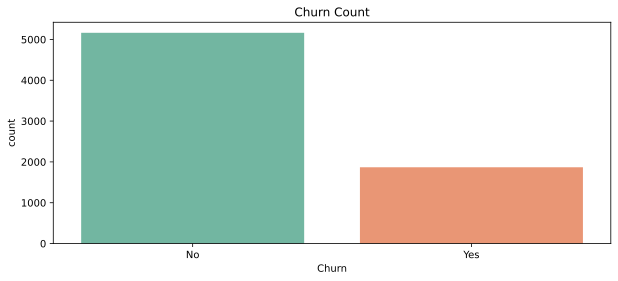

In [34]:
plt.figure(figsize=(10,4),dpi=250)
sns.countplot(data=df,x='Churn',hue='Churn',palette='Set2')
plt.title('Churn Count')
plt.savefig("visualisations/Churn_Count.svg");


### Monthly Charges by Churn Status

This boxplot compares the distribution of monthly charges for customers who churned versus those who did not.

**Importance:**  
- Highlights differences in spending patterns between churned and retained customers.
- Helps identify whether higher monthly charges are associated with increased churn risk.
- The use of `hue='Churn'` visually separates the two groups for clearer comparison.



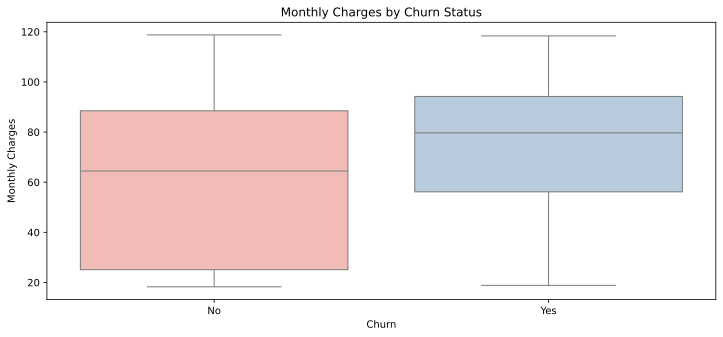

In [47]:
plt.figure(figsize=(12,5))
sns.boxplot(data=df, x='Churn', y='MonthlyCharges', hue='Churn', palette='Pastel1', dodge=False)
plt.title('Monthly Charges by Churn Status')
plt.xlabel('Churn')
plt.ylabel('Monthly Charges')
plt.savefig("visualisations/Monthly_Charges_by_Churn.svg");

### Distribution of Total Charges by Churn Status

The boxplot below illustrates the distribution of `TotalCharges` for customers who churned versus those who did not. By comparing these distributions, we can assess whether customers with higher or lower total charges are more likely to churn.

**Importance:**
- Reveals potential differences in spending patterns between churned and retained customers.
- Helps identify if high or low total charges are correlated with increased churn risk.
- Can inform targeted retention strategies for specific customer segments.


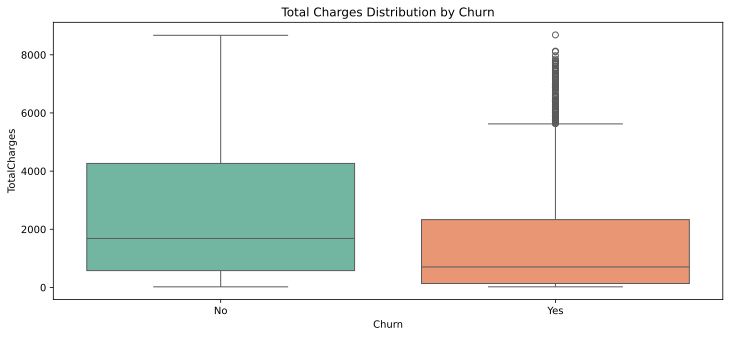

In [35]:
plt.figure(figsize=(12,5),dpi=250)
sns.boxplot(data=df,x='Churn',y='TotalCharges',hue='Churn',palette='Set2')
plt.title('Total Charges Distribution by Churn')
plt.savefig("visualisations/Total_Charges_Distribution.svg");

### Total Charges Distribution by Contract Type and Churn Status

This boxplot displays the distribution of `TotalCharges` for each contract type, with colors indicating whether the customer churned or not.

**Importance:**  
- Reveals how total charges vary across different contract types and between churned and retained customers.
- Helps identify if certain contract types are associated with higher total charges and increased churn risk.

> **Interpretation Tip:** Look for differences in the median and spread of total charges between churned and non-churned customers within each contract type.

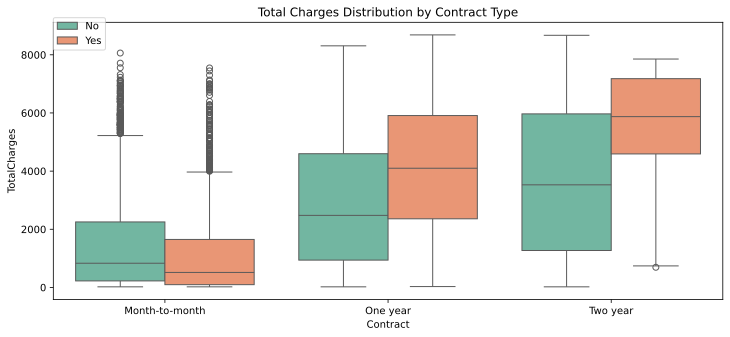

In [40]:
### Distribution of Total Charges by Contract Type and Churn Status

plt.figure(figsize=(12,5))
sns.boxplot(data=df,y='TotalCharges',x='Contract',hue='Churn',palette='Set2')
plt.title('Total Charges Distribution by Contract Type')
plt.savefig("visualisations/Total_Charges_Distribution_by_Contract.svg");
plt.legend(loc=(0,0.9));

### Customer Distribution by Contract Type

This count plot shows the number of customers for each contract type (e.g., Month-to-month, One year, Two year).

**Importance:**  
- Reveals the most common contract types among customers.
- Helps identify segments that may require focused retention strategies.

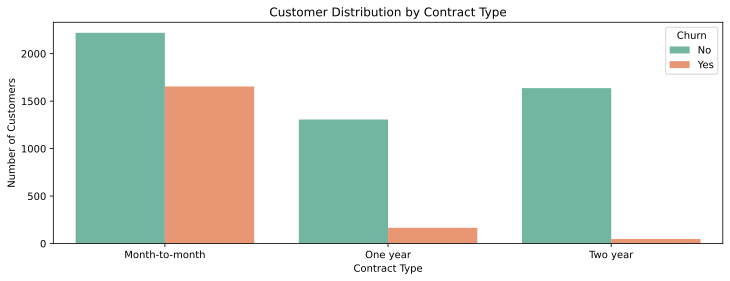

In [41]:
plt.figure(figsize=(12,4))
sns.countplot(data=df, x='Contract', hue='Churn',palette='Set2')
plt.title('Customer Distribution by Contract Type')
plt.ylabel('Number of Customers')
plt.xlabel('Contract Type')
plt.savefig("visualisations/Customer_Distribution_by_Contract_Type.svg")

### Churn Rate by Internet Service Type

This plot shows the proportion of customers who churned or stayed, grouped by their type of internet service.

**Importance:**  
- Identifies which internet service types are associated with higher or lower churn rates.
- The use of `hue='Churn'` provides a clear breakdown of churn status within each internet service group.
- Useful for targeting specific service users with retention efforts.


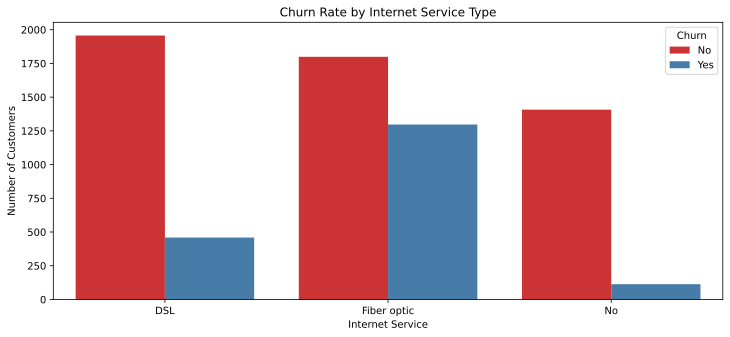

In [48]:
plt.figure(figsize=(12,5))
sns.countplot(data=df, x='InternetService', hue='Churn', palette='Set1')
plt.title('Churn Rate by Internet Service Type')
plt.ylabel('Number of Customers')
plt.xlabel('Internet Service')
plt.legend(title='Churn')
plt.savefig("visualisations/Churn_Rate_by_Internet_Service.svg");

### Feature Correlation with Churn

This bar plot displays the correlation of selected customer features with the target variable, `Churn`. Since correlation calculations require numeric data, all categorical features are first converted into dummy (one-hot encoded) variables.

**Features included:**
```
- gender
- SeniorCitizen
- Partner
- Dependents
- PhoneService
- MultipleLines
- OnlineSecurity
- OnlineBackup
- DeviceProtection
- TechSupport
- InternetService
- StreamingTV
- StreamingMovies
- Contract
- PaperlessBilling
- PaymentMethod
```
**Importance:**
- Highlights which customer attributes are most strongly associated with churn.
- Helps prioritize features for further analysis and model building.
- Reveals both positive and negative relationships between features and the likelihood of customer churn.

In [16]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [54]:
corr_df  = pd.get_dummies(df[['gender', 'SeniorCitizen', 'Partner', 'Dependents','PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport','StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod','Churn']]).corr()

In [29]:
corr_df['Churn_Yes'].sort_values().iloc[1:-1]

Contract_Two year                         -0.301552
StreamingMovies_No internet service       -0.227578
StreamingTV_No internet service           -0.227578
TechSupport_No internet service           -0.227578
DeviceProtection_No internet service      -0.227578
OnlineBackup_No internet service          -0.227578
OnlineSecurity_No internet service        -0.227578
InternetService_No                        -0.227578
PaperlessBilling_No                       -0.191454
Contract_One year                         -0.178225
OnlineSecurity_Yes                        -0.171270
TechSupport_Yes                           -0.164716
Dependents_Yes                            -0.163128
Partner_Yes                               -0.149982
PaymentMethod_Credit card (automatic)     -0.134687
InternetService_DSL                       -0.124141
PaymentMethod_Bank transfer (automatic)   -0.118136
PaymentMethod_Mailed check                -0.090773
OnlineBackup_Yes                          -0.082307
DeviceProtec

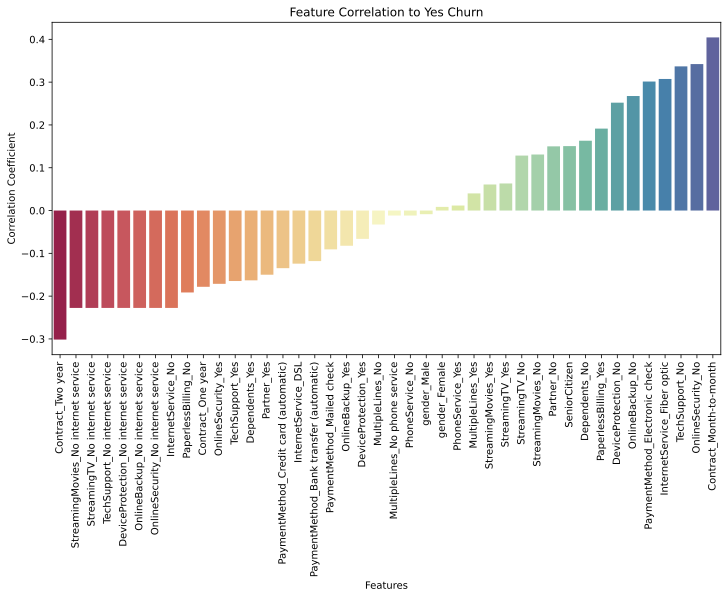

In [50]:
plt.figure(figsize=(12,6), dpi=250)
sns.barplot(
    x=corr_df['Churn_Yes'].sort_values().iloc[1:-1].index,
    y=corr_df['Churn_Yes'].sort_values().iloc[1:-1].values,
    hue=corr_df['Churn_Yes'].sort_values().iloc[1:-1].index,
    palette='Spectral'
)
plt.title("Feature Correlation to Yes Churn")
plt.ylabel("Correlation Coefficient")
plt.xlabel("Features")
plt.savefig("visualisations/Feature_Correlation_to_Yes_Churn.svg")
plt.xticks(rotation=90);

### Pairplot of Key Features

This pairplot shows pairwise relationships between selected features, colored by churn status.

**Importance:**  
- Helps visualize potential interactions and separability between churned and non-churned customers.
- Useful for detecting trends, clusters, and outliers in the data.
- Aids in feature selection and understanding feature relationships.

> **Interpretation Tip:** Look for clear separation between churn classes in the scatterplots; this suggests those features may be predictive.

In [63]:
key_features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']
sns.pairplot(df[key_features], hue='Churn', palette='Set1', diag_kind='kde', plot_kws={'alpha':0.7})
plt.suptitle('Pairplot of Key Features', y=1.02)
plt.savefig("visualisations/Pairplot_Key_Features.svg")

---

## Churn Analysis

In this section, we segment customers into distinct cohorts based on their tenure with the company. By analyzing these tenure-based cohorts, we can uncover differences in churn behavior across customer segments.

**Importance:**  
- Enables targeted analysis of customer groups at different stages of their lifecycle.
- Helps identify patterns in churn risk among new, mid-term, and long-term customers.
- Supports the development of cohort-specific retention strategies.

---

**What are the 3 contract types available?**

In [153]:
df['Contract'].unique()

array(['Month-to-month', 'One year', 'Two year'], dtype=object)

### Distribution of Customer Tenure

This histogram visualizes how long customers have been with the company.

**Importance:**  
- Helps identify if churn is more common among new or long-term customers.
- Useful for segmenting customers based on their tenure.

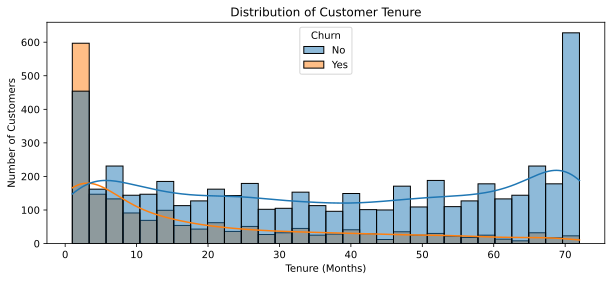

In [60]:
plt.figure(figsize=(10,4))
sns.histplot(data=df,x='tenure', bins=30,hue='Churn', kde=True, color='skyblue')
plt.title('Distribution of Customer Tenure')
plt.xlabel('Tenure (Months)')
plt.ylabel('Number of Customers')
plt.savefig("visualisations/Customer_Tenure_Distribution.svg")

<img src="fig5.png">

### Histograms by Churn and Contract Type

Below, we visualize the distribution of a selected numerical feature, separated by both `Churn` status and `Contract` type.

**Importance:**  
- Allows for comparison of feature distributions across different customer segments.
- Helps identify patterns or anomalies specific to churn status within each contract type.

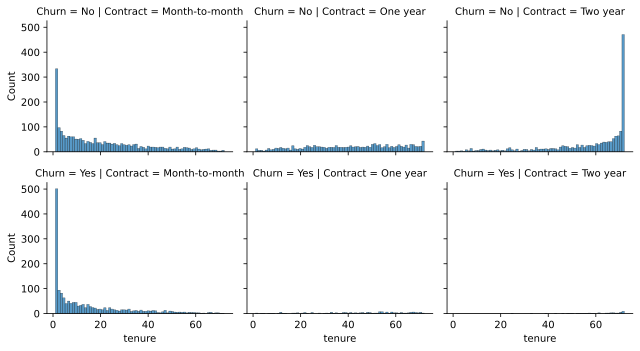

In [73]:
sns.displot(
    data=df,
    x='tenure',
    bins=70,
    col='Contract',
    row='Churn',
    height=2.5,    
    aspect=1.2       
)
plt.savefig("visualisations/Tenure_Distribution_by_Contract_and_Churn.svg")

### Total Charges vs. Monthly Charges by Churn Status

This scatter plot displays the relationship between `TotalCharges` and `MonthlyCharges`, with points colored according to churn status.

**Importance:**  
- Reveals how monthly and total charges are distributed among churned and non-churned customers.
- Helps identify if certain billing patterns are associated with higher churn risk.



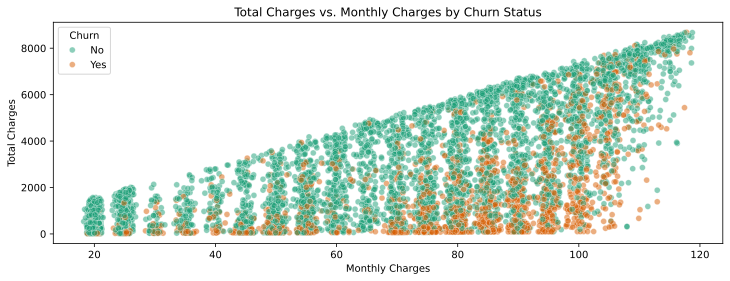

In [68]:
plt.figure(figsize=(12,4), dpi=200)
sns.scatterplot(
    data=df,
    x='MonthlyCharges',
    y='TotalCharges',
    hue='Churn',
    linewidth=0.5,
    alpha=0.5,
    palette='Dark2'
)
plt.title('Total Charges vs. Monthly Charges by Churn Status')
plt.xlabel('Monthly Charges')
plt.ylabel('Total Charges')
plt.savefig("visualisations/TotalCharges_vs_MonthlyCharges_by_Churn.svg");


<img src='fig7.png'>

### Cohort Analysis Based on Tenure

In this section, we segment customers into cohorts based on their tenure—the number of months they have been with the company. Each unique tenure value (from 1 to 72 months) is treated as a separate cohort. For each cohort, we calculate the churn rate, defined as the percentage of customers within that tenure group who have churned (`Churn = Yes`).

By analyzing churn rates across tenure cohorts, we can uncover valuable insights into customer behavior over time. Typically, we expect to see higher churn rates among new customers, with the rate decreasing as tenure increases. This pattern reflects the idea that customers who have been with the company longer are more likely to remain loyal.

This analysis can help answer questions such as:
- Are there specific tenure periods where churn risk is highest?
- How quickly does the churn rate drop as tenure increases?
- Are there unexpected spikes in churn for certain tenure cohorts that may indicate issues with service or customer experience?

Understanding these patterns is crucial for designing effective retention strategies. For example, if churn is especially high in the first few months, targeted onboarding or early engagement programs could be implemented to improve retention.

We will visualize the churn rate for each tenure cohort to clearly observe these trends and identify any anomalies that may warrant further investigation.

In [74]:
no_churn = df.groupby(['Churn','tenure']).count().transpose()['No']
yes_churn = df.groupby(['Churn','tenure']).count().transpose()['Yes']

In [75]:
churn_rate = 100 * yes_churn / (no_churn+yes_churn)

In [76]:
churn_rate.transpose()['customerID']

tenure
1     61.990212
2     51.680672
3     47.000000
4     47.159091
5     48.120301
        ...    
68     9.000000
69     8.421053
70     9.243697
71     3.529412
72     1.657459
Name: customerID, Length: 72, dtype: float64

**Now that you have Churn Rate per tenure group 1-72 months, Let's create a plot showing churn rate per months of tenure.**

### Churn Rate by Months of Tenure

The plot below displays the churn rate for each tenure cohort, from 1 to 72 months. Each point represents the percentage of customers with a given tenure who have churned.

Tracking churn rate by tenure helps reveal critical periods when customers are most at risk of leaving. This information can guide targeted retention strategies, especially for cohorts with unusually high churn rates.

Look for a downward trend, as longer-tenured customers typically show greater loyalty and lower churn rates.

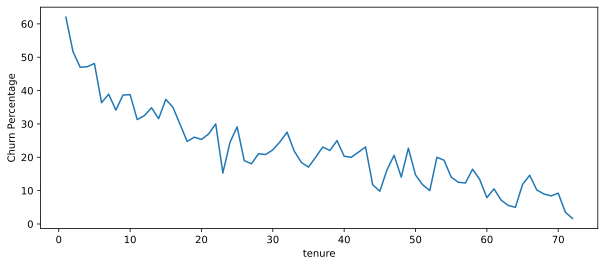

In [80]:
plt.figure(figsize=(10,4),dpi=200)
churn_rate.iloc[0].plot()
plt.ylabel('Churn Percentage');
plt.savefig("visualisations/Churn_Rate_by_Tenure.svg")

<img src='fig9.png'>

### Broader Tenure Cohort Groups

To simplify analysis, we group customers into broader tenure cohorts based on the number of months they have been with the company. We create a new column, `Tenure Cohort`, with the following categories:
- '0-12 Months'
- '12-24 Months'
- '24-48 Months'
- 'Over 48 Months'

This grouping helps compare churn behavior across major customer lifecycle stages.

In [81]:
def cohort(tenure):
    if tenure < 13:
        return '0-12 Months'
    elif tenure < 25:
        return '12-24 Months'
    elif tenure < 49:
        return '24-48 Months'
    else:
        return "Over 48 Months"

In [82]:
df['Tenure Cohort'] = df['tenure'].apply(cohort)

In [83]:
df.head(10)[['tenure','Tenure Cohort']]

,tenure,Tenure Cohort
0,1,0-12 Months
1,34,24-48 Months
2,2,0-12 Months
3,45,24-48 Months
4,2,0-12 Months
5,8,0-12 Months
6,22,12-24 Months
7,10,0-12 Months
8,28,24-48 Months
9,62,Over 48 Months


### Total Charges vs. Monthly Charges by Tenure Cohort

This scatter plot visualizes the relationship between `TotalCharges` and `MonthlyCharges`, with points colored according to the broader tenure cohort each customer belongs to.

Grouping by tenure cohort helps reveal how customer billing patterns differ across various stages of the customer lifecycle.

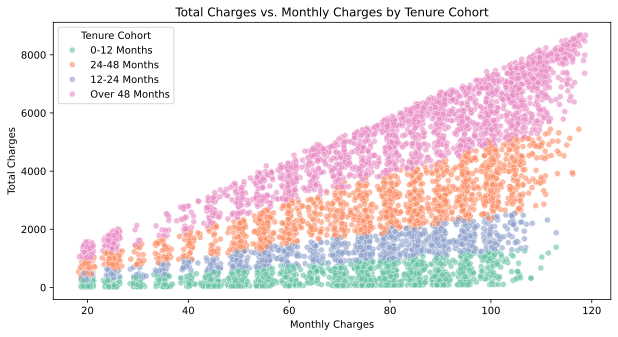

In [85]:
plt.figure(figsize=(10,5), dpi=200)
sns.scatterplot(
    data=df,
    x='MonthlyCharges',
    y='TotalCharges',
    hue='Tenure Cohort',
    palette='Set2',
    alpha=0.6,
    linewidth=0.5
)
plt.title('Total Charges vs. Monthly Charges by Tenure Cohort')
plt.xlabel('Monthly Charges')
plt.ylabel('Total Charges')
plt.legend(title='Tenure Cohort')
plt.savefig('visualisations/total_charges_vs_monthly_charges.svg')

### Churn Count per Tenure Cohort

This count plot shows the number of customers who churned or stayed within each tenure cohort group.

Visualizing churn counts by cohort helps identify which customer lifecycle stages have the highest churn volume, guiding targeted retention efforts.

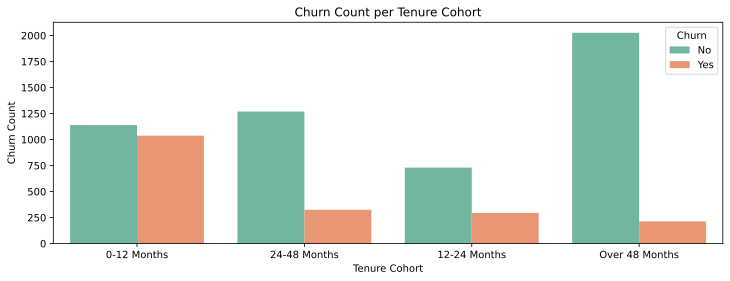

In [87]:
plt.figure(figsize=(12,4),dpi=200)
sns.countplot(data=df,x='Tenure Cohort',hue='Churn',palette='Set2')
plt.title('Churn Count per Tenure Cohort')
plt.xlabel('Tenure Cohort')
plt.ylabel('Churn Count')
plt.legend(title='Churn')
plt.savefig('visualisations/churn_count_per_tenure_cohort.svg')



### Churn Count per Tenure Cohort and Contract Type

This grid of count plots displays the number of customers in each tenure cohort, separated by contract type and colored by churn status.

By visualizing these relationships, we can identify how churn patterns differ across both tenure and contract segments, revealing which combinations may be most at risk.

<Figure size 2000x800 with 0 Axes>

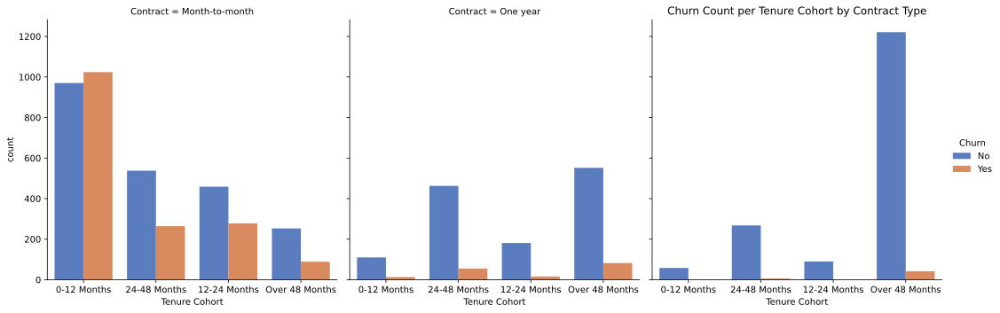

In [96]:
plt.figure(figsize=(10,4),dpi=200)
sns.catplot(data=df,x='Tenure Cohort',hue='Churn',col='Contract',kind='count',palette='muted')
plt.title('Churn Count per Tenure Cohort by Contract Type')
plt.savefig('visualisations/churn_count_per_tenure_cohort.svg');

-----

## Part 4: Predictive Modeling

In this section, we explore several tree-based machine learning models to predict customer churn. The models covered include:
- Single Decision Tree
- Random Forest
- AdaBoost
- Gradient Boosting

You are encouraged to experiment with additional supervised learning algorithms to compare their performance and gain deeper insights into the dataset.

---

### Single Decision Tree

We begin with a single decision tree classifier, which serves as a simple yet interpretable baseline for churn prediction. This model will help us understand the most important features and provide a reference point for evaluating more complex ensemble methods.

### Preparing Features and Labels for Modeling

Before training our models, we need to:
- Separate the features (`X`) from the target label (`y`).
- Convert categorical variables into dummy/indicator variables.
- Drop features that are not useful for prediction, such as unique identifiers or columns with little predictive value.

**Commonly dropped features:**  
- `customerID`: Unique identifier, not predictive.
- Any other columns with only one unique value or irrelevant to churn.

Let's prepare the data accordingly.

In [128]:
X = df.drop(['Churn','customerID'],axis=1)
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

In [129]:
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

Shape of X: (7032, 33)
Shape of y: (7032,)


### Train-Test Split

We split the data into training and testing sets, holding out 10% for testing. This allows us to evaluate model performance on unseen data. A `random_state` of 42 is set for reproducibility.

In [130]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [131]:
print("--------")
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("--------")
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)
print("--------")


--------
Shape of X_train: (6328, 33)
Shape of y_train: (6328,)
--------
Shape of X_test: (704, 33)
Shape of y_test: (704,)
--------


### Decision Tree Performance

In this section, we train and evaluate a single decision tree classifier for predicting customer churn. We will:
1. Train the model.
2. Evaluate the model using performance metrics and a confusion matrix.
3. Calculate and display feature importances.
4. Optionally, visualize the decision tree structure (note: large trees may be difficult to display).

---

#### Decision Tree Instantiation and Hyperparameter Tuning

We instantiate a Decision Tree classifier and use grid search with cross-validation to find the optimal tree depth. This helps prevent overfitting and ensures the model generalizes well to unseen data.

In [141]:
param_grid = {
    'max_depth': [3, 5, 7, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}


In [ ]:
# Instantiate and perform grid search
dt_grid = GridSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_grid,
    cv=5,
    verbose=1
)

In [156]:
dt = DecisionTreeClassifier(random_state=101).fit(X_train, y_train)

In [144]:
# Retrieve the best estimator
dtree = dt_grid.best_estimator_
print("Best Decision Tree Parameters:", dt_grid.best_params_)

Best Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 2, 'min_samples_split': 5}


In [157]:
preds = dt.predict(X_test)

In [158]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

          No       0.81      0.81      0.81       511
         Yes       0.50      0.50      0.50       193

    accuracy                           0.72       704
   macro avg       0.65      0.66      0.65       704
weighted avg       0.73      0.72      0.72       704



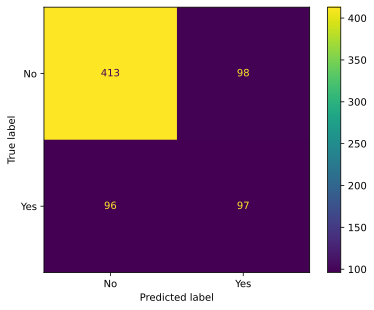

In [159]:
ConfusionMatrixDisplay.from_predictions(y_test,preds)

### Feature Importances from Decision Tree

The table below displays the importance of each feature as determined by the decision tree. Higher values indicate features that play a larger role in predicting churn.

In [160]:
imp_feats = pd.DataFrame(
    data=dt.feature_importances_,
    index=X.columns,
    columns=['Feature Importance']
).sort_values("Feature Importance", ascending=False)



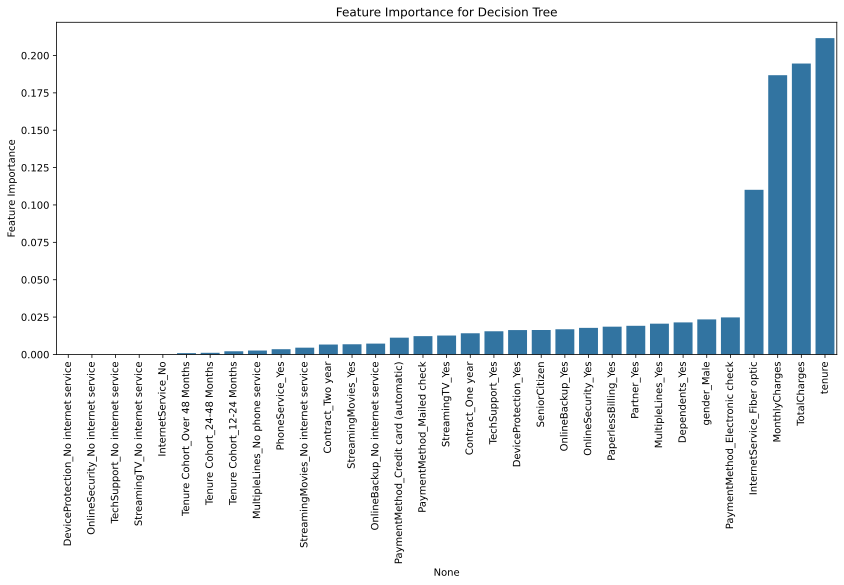

In [161]:
plt.figure(figsize=(14,6),dpi=200)
sns.barplot(data=imp_feats.sort_values('Feature Importance'),x=imp_feats.sort_values('Feature Importance').index,y='Feature Importance')
plt.xticks(rotation=90)
plt.title("Feature Importance for Decision Tree");

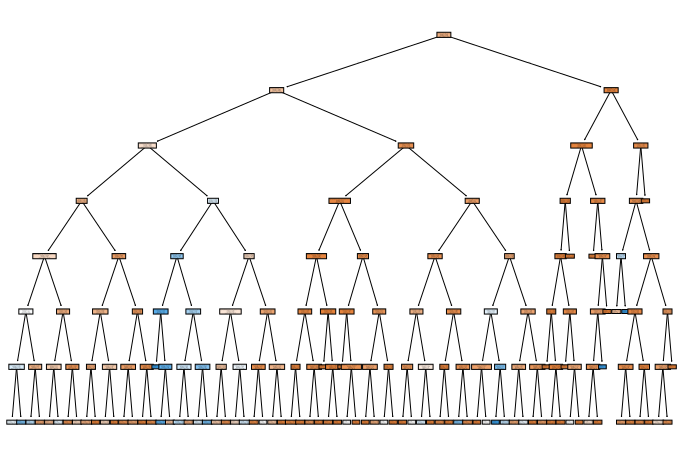

In [151]:
plt.figure(figsize=(12,8),dpi=150)
plot_tree(dtree,filled=True,feature_names=X.columns);

## Random Forest

**TASK: Create a Random Forest model and create a classification report and confusion matrix from its predicted results on the test set.**

In [259]:
#CODE HERE

In [260]:
from sklearn.ensemble import RandomForestClassifier

In [266]:
rf = RandomForestClassifier(n_estimators=100)

In [267]:
rf.fit(X_train,y_train)

RandomForestClassifier()

In [268]:
preds = rf.predict(X_test)

In [269]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

          No       0.86      0.89      0.87       557
         Yes       0.52      0.44      0.48       147

    accuracy                           0.80       704
   macro avg       0.69      0.67      0.68       704
weighted avg       0.79      0.80      0.79       704



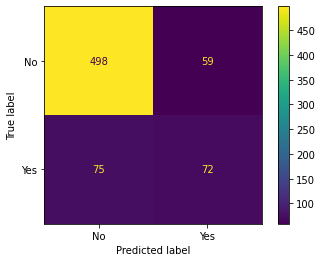

In [270]:
plot_confusion_matrix(dt,X_test,y_test)

## Boosted Trees

**TASK: Use AdaBoost or Gradient Boosting to create a model and report back the classification report and plot a confusion matrix for its predicted results**

In [ ]:
#CODE HERE

In [288]:
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier

In [289]:
ada_model = AdaBoostClassifier()

In [290]:
ada_model.fit(X_train,y_train)

AdaBoostClassifier()

In [291]:
preds = ada_model.predict(X_test)

In [292]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

          No       0.88      0.90      0.89       557
         Yes       0.60      0.54      0.57       147

    accuracy                           0.83       704
   macro avg       0.74      0.72      0.73       704
weighted avg       0.82      0.83      0.83       704



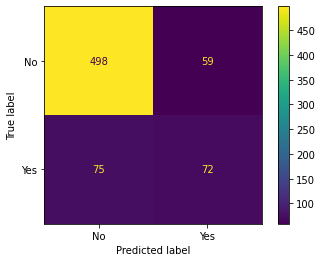

In [293]:
plot_confusion_matrix(dt,X_test,y_test)

**TASK: Analyze your results, which model performed best for you?**

In [1]:
# With base models, we got best performance from an AdaBoostClassifier, but note, we didn't do any gridsearching AND most models performed about the same on the data set.

### Great job!